In [24]:
#%%
"""
LDA TRAJECTORIES ACROSS LEARNING
================================
The LDA is fit ONCE on the proficient (recording) sessions, exactly as in
lda_sweep_timepoints.py. That fit defines a fixed reference frame. Every other
timepoint is then PROJECTED into that frame -- never refitted -- so all timepoints
live in the same coordinates and can be compared.

Why it has to be done this way: early and late training have ONE session per mouse,
so there is no within-mouse scatter there and LDA cannot be fit at those timepoints
at all. Only the between-mouse configuration is estimable, which is exactly what a
fixed frame plus projection gives you.

The question "is there a rotation?" is then answered by comparing the CONFIGURATION
of mice at consecutive timepoints, using the same mice throughout.
"""
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from scipy.linalg import orthogonal_procrustes, subspace_angles
from scipy.stats import sem

base_path = '/home/ines/repositories/representation_learning_variability/paper-individuality/data/'
LDA_FILE = ('/home/ines/repositories/representation_learning_variability/'
            'paper-individuality/clustering/data_files/mouse_LDA_5_bins_cut28-08-2026')

#%%
def filter_sequences(all_sequences, min_sessions=1):
    """min_sessions=1 keeps the bad-session exclusion but does not require several
    sessions per mouse -- the training timepoints have exactly one."""
    all_sequences = all_sequences.loc[~all_sequences['session'].isin(prob_sessions)].reset_index(drop=True)
    session_count = (all_sequences[['mouse_name', 'session']].drop_duplicates()
                     .groupby(['mouse_name'])['session'].count().reset_index())
    keep = session_count.loc[session_count['session'] >= min_sessions, 'mouse_name']
    all_sequences = all_sequences.loc[all_sequences['mouse_name'].isin(keep)].reset_index(drop=True)
    return all_sequences


def binarize(use_sequences, n_paw_states=8, keep_paw=True, keep_whisk=True, keep_lick=True):
    """Identical to lda_sweep_timepoints.binarize (kept local so this notebook is
    self-contained). Turns integer syllable codes into per-timestep indicators."""
    if not (keep_paw or keep_whisk or keep_lick):
        raise ValueError("At least one feature type must be kept.")
    n_raw = n_paw_states + 2
    n_trials, timesteps = use_sequences.shape
    binarized = np.zeros((n_trials, timesteps * n_raw))
    for t in range(timesteps):
        vals = use_sequences[:, t]
        nan_mask = np.isnan(vals); valid = ~nan_mask
        labels = vals[valid].astype(int)
        start = t * n_raw
        if len(labels):
            rows = np.arange(n_trials)[valid]
            binarized[rows, start + (labels % n_paw_states)] = 1
            binarized[valid, start + n_paw_states] = ((labels // n_paw_states) % 2).astype(int)
            binarized[valid, start + n_paw_states + 1] = (labels // (n_paw_states * 2)).astype(int)
        if np.any(nan_mask):
            binarized[nan_mask, start:start + n_raw] = np.nan
    cols = []
    if keep_paw:   cols += [i for i in range(n_paw_states) if i != 1]
    if keep_whisk: cols += [n_paw_states]
    if keep_lick:  cols += [n_paw_states + 1]
    all_cols = [t * n_raw + c for t in range(timesteps) for c in cols]
    return binarized[:, all_cols]


def build_multi_timepoint(files_by_label, keep_paw=True, keep_whisk=True, keep_lick=True,
                          min_sessions_by_label=None, exclude_by_label=None):
    """
    Loads several syllable files at once and returns ONE session-level design matrix
    with a timepoint label per row, so a single frame can be applied to all of them.

    Returns
    -------
    X          : (n_sessions, n_features) session-averaged binarised syllables
    mice       : (n_sessions,) mouse name
    timepoint  : (n_sessions,) label from files_by_label
    sessions   : (n_sessions,) session eid
    """
    # min_sessions is PER FILE. The sweep fits its LDA on proficient mice with >=3
    # sessions, so the reference file must use 3 here or this frame is not the same
    # frame as the sweep's: with min_sessions=1 the proficient set balloons to 101
    # mice, many with a single session, and a 101-class LDA on ~330 sessions is
    # badly under-determined.
    # BAD-SESSION EXCLUSION, APPLIED TO EVERY TIMEPOINT.
    # filter_sequences drops `prob_sessions` (the globally bad sessions) from every
    # file. On top of that, the sweep excludes a per-timepoint list -- session_1 for
    # Early and last_training for Late (lda_sweep_timepoints.py: exclude_sessions =
    # [session_1, last_training, []]). Those were previously applied to nothing here,
    # so 18 Early and 12 Late sessions that the sweep discards were being kept.
    min_sessions_by_label = min_sessions_by_label or {}
    exclude_by_label = exclude_by_label or {}
    frames = []
    for label, path in files_by_label.items():
        seq = pd.read_parquet(path)
        seq['session'] = seq['sample'].str[:36]
        n0 = seq['session'].nunique()
        seq = filter_sequences(seq, min_sessions=min_sessions_by_label.get(label, 1))
        n1 = seq['session'].nunique()
        drop = list(exclude_by_label.get(label, []))
        if drop:
            seq = seq.loc[~seq['session'].isin(drop)]
        n2 = seq['session'].nunique()
        print(f"  {label:11s} {n0:4d} sessions -> {n1:4d} after prob_sessions/min_sessions"
              f" -> {n2:4d} after the {label} exclusion list "
              f"({n0-n1} + {n1-n2} dropped)")
        seq['timepoint'] = label
        frames.append(seq)
    allseq = pd.concat(frames)

    design = (allseq.pivot(index=['mouse_name', 'session', 'sample', 'trial_type', 'timepoint'],
                           columns=['broader_label'], values='binned_sequence')
              .reset_index().dropna())
    if 'index' in design.columns:
        design = design.drop(columns=['index'])
    design = design.sort_values(by=['timepoint', 'session'])
    assert len(design) > 0, "design is empty after filtering"

    epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']
    seqs = np.vstack(design[epoch_to_analyse].apply(lambda r: np.hstack(r), axis=1))
    feats = binarize(seqs, n_paw_states=8, keep_paw=keep_paw,
                     keep_whisk=keep_whisk, keep_lick=keep_lick)

    tmp = pd.DataFrame(feats)
    tmp['session'] = design['session'].values
    per_session = tmp.groupby('session', sort=False)[np.arange(feats.shape[1])].mean()

    # drop features that are NaN for any session (would break PCA)
    bad = per_session.isna().any(axis=0)
    if bad.sum():
        print(f"!! dropping {int(bad.sum())} features that are NaN for some session")
        per_session = per_session.loc[:, ~bad]

    meta = design[['session', 'mouse_name', 'timepoint']].drop_duplicates().set_index('session')
    meta = meta.reindex(per_session.index)
    print(f"✓ {len(per_session)} sessions, {per_session.shape[1]} features, "
          f"{meta.mouse_name.nunique()} mice")
    print(meta.groupby('timepoint').agg(sessions=('mouse_name','size'),
                                        mice=('mouse_name','nunique')).to_string())
    return (np.asarray(per_session), meta['mouse_name'].values,
            meta['timepoint'].values, np.asarray(per_session.index))


def fit_reference_frame(X, mice, timepoint, ref_label='Proficient', min_ref_sessions=3,
                        n_pcs=20, n_lds=3, verbose=True):
    """
    PCA -> z-score -> LDA, ALL fit on ONE chosen timepoint (`ref_label`), then
    applied to every session. That timepoint is the reference frame; every other
    timepoint is a pure out-of-sample projection into it.

    ref_label        which timepoint defines the space. 'Proficient' reproduces the
                     sweep; 'Pre-rec' lets you ignore the proficient data entirely.
    min_ref_sessions a mouse must have at least this many sessions AT the reference
                     timepoint to be a class in the LDA fit. LDA needs >=2 per class
                     to have any within-class scatter; the sweep uses 3.
                     Filtering here rather than at load time means one build serves
                     every choice of reference, and mice excluded from the FIT are
                     still projected and plotted.
    """
    ref_all = timepoint == ref_label
    assert ref_all.sum() > 0, f"no sessions with timepoint == {ref_label!r}"
    counts = pd.Series(mice[ref_all]).value_counts()
    eligible = set(counts[counts >= min_ref_sessions].index)
    ref = ref_all & np.isin(mice, list(eligible))
    assert ref.sum() > 0, (f"no mouse has >= {min_ref_sessions} sessions at {ref_label}; "
                           f"max is {int(counts.max())}")

    pca = PCA(n_components=min(n_pcs, ref.sum() - 1, X.shape[1]), random_state=0).fit(X[ref])
    Z = pca.transform(X)
    scaler = StandardScaler().fit(Z[ref])
    Zs = scaler.transform(Z)

    n_classes = len(np.unique(mice[ref]))
    n_lds = min(n_lds, n_classes - 1, Zs.shape[1])
    lda = LinearDiscriminantAnalysis(solver='eigen', shrinkage='auto',
                                     priors=np.ones(n_classes) / n_classes,
                                     n_components=n_lds)
    lda.fit(Zs[ref], mice[ref])
    coords = lda.transform(Zs)[:, :n_lds]
    if verbose:
        print(f"✓ frame = {ref_label}: fit on {ref.sum()} sessions / {n_classes} mice "
              f"(>= {min_ref_sessions} sessions each) -> {pca.n_components_} PCs -> {n_lds} LDs")
        dropped = int(ref_all.sum() - ref.sum())
        if dropped:
            print(f"   {dropped} {ref_label} sessions excluded from the FIT "
                  f"(mice with < {min_ref_sessions} sessions there); still projected")
    return coords, dict(pca=pca, scaler=scaler, lda=lda, n_lds=n_lds,
                        ref_label=ref_label, ref_mask=ref, n_classes=n_classes)


# backwards-compatible alias
def fit_proficient_frame(X, mice, timepoint, ref_label='Proficient', n_pcs=20, n_lds=3):
    return fit_reference_frame(X, mice, timepoint, ref_label=ref_label,
                               min_ref_sessions=3, n_pcs=n_pcs, n_lds=n_lds)


def mouse_by_timepoint(coords, mice, timepoint, order):
    """Average a mouse's sessions within each timepoint -> one point per mouse per
    timepoint. Returns a dict label -> DataFrame indexed by mouse."""
    out = {}
    df = pd.DataFrame(coords, columns=[f'LD{i+1}' for i in range(coords.shape[1])])
    df['mouse'] = mice; df['timepoint'] = timepoint
    for lab in order:
        sub = df[df.timepoint == lab].groupby('mouse')[
            [c for c in df.columns if c.startswith('LD')]].mean()
        out[lab] = sub
    return out


def rotation_angles(R):
    """
    Rotation angles of an orthogonal matrix, taken from the arguments of its complex
    eigenvalues. Necessary because the usual 3D formula cos(theta)=(trace(R)-1)/2 is
    only valid for a PROPER rotation (det=+1); with a reflection it returns a
    meaningless number. Reflections show up here as real eigenvalues near -1.
    """
    ev = np.linalg.eigvals(R)
    ang = np.degrees(np.abs(np.angle(ev)))
    # complex conjugate pairs -> genuine rotation planes; keep one of each pair
    rot = sorted({round(a, 4) for a, e in zip(ang, ev)
                  if abs(e.imag) > 1e-8}, reverse=True)
    n_refl = int(np.sum((np.abs(ev.imag) < 1e-8) & (ev.real < 0)))
    return rot, n_refl


def similarity_transform(A, B):
    """
    Best s (scale), R (orthogonal), t (translation) minimising ||s*A@R + t - B||.
    A and B must have MATCHED ROWS (the same mice, in the same order).

    Returns a dict with the rotation angle, the scale, the translation length, the
    reflection flag and the relative residual (how much of the change is NOT a
    scaled rotation + shift).
    """
    A = np.asarray(A, float); B = np.asarray(B, float)
    Ac = A - A.mean(0); Bc = B - B.mean(0)
    R, ss = orthogonal_procrustes(Ac, Bc)
    s = ss / (Ac ** 2).sum()
    resid = np.linalg.norm(s * Ac @ R - Bc) / np.linalg.norm(Bc)
    det = np.linalg.det(R)
    rot, n_refl = rotation_angles(R)
    angle = rot[0] if rot else 0.0
    return dict(scale=float(s), angle_deg=float(angle), all_angles=rot,
                n_reflections=n_refl, reflection=bool(det < 0),
                residual=float(resid),
                shift=float(np.linalg.norm(B.mean(0) - A.mean(0))),
                dispersion_A=float(np.sqrt((Ac ** 2).sum(1).mean())),
                dispersion_B=float(np.sqrt((Bc ** 2).sum(1).mean())))


def apply_frame(ref_label, min_ref_sessions=3, show=None, n_pcs=None, n_lds=None):
    """
    Refit the embedding on `ref_label` and refresh the globals every plot uses
    (coords, frame, per_tp, ORDER, complete). `show` picks which timepoints to keep
    in the plots and in what temporal order.
    """
    global coords, frame, per_tp, complete, ORDER
    n_pcs = N_PCS if n_pcs is None else n_pcs
    n_lds = N_LDS if n_lds is None else n_lds
    ORDER = list(show) if show is not None else all_order()
    coords, frame = fit_reference_frame(X, mice, timepoint, ref_label=ref_label,
                                       min_ref_sessions=min_ref_sessions,
                                       n_pcs=n_pcs, n_lds=n_lds)
    per_tp = mouse_by_timepoint(coords, mice, timepoint, ORDER)
    complete = sorted(set.intersection(*[set(per_tp[l].index) for l in ORDER]))
    print(f"   showing {ORDER}; {len(complete)} mice present at all of them")
    for l in ORDER:
        tag = '  <- IN-SAMPLE (frame fit here)' if l == ref_label else ''
        print(f"     {l:11s} {len(per_tp[l]):3d} mice{tag}")
    return coords, per_tp, complete


def all_order():
    """Full temporal order, falling back to ORDER if ALL_ORDER was not defined
    (e.g. the config cell was edited). Avoids a NameError deep inside a plot."""
    return list(globals().get('ALL_ORDER', globals().get('ORDER', [])))


In [25]:
#%%
""" CONFIG AND BUILD """

""" SESSION EXCLUSIONS -- from the curated QC sheet, not hardcoded lists """
from session_filters import exclusions_by_timepoint, report_exclusions

# THE FILTER PARAMETER:
#   'filtered_out'            -> drop Used in paper == 'filtered out'
#   'filtered_out_and_revise' -> drop those PLUS 'need to revise'
QC_STRICTNESS = 'filtered_out'

EXCLUDE_BY_LABEL = exclusions_by_timepoint(QC_STRICTNESS)
# filter_sequences() still applies this to every file; it is now the sheet's
# proficient exclusions rather than the old hand-maintained prob_sessions list.
prob_sessions = EXCLUDE_BY_LABEL['Proficient']
print(f"exclusions from the sheet ({QC_STRICTNESS}): "
      + ", ".join(f"{k} {len(v)}" for k, v in EXCLUDE_BY_LABEL.items()))

BIN = '8_k_10_bin'          # '8_k_10_bin' = 360 features, '8_k_1_bin' = 36
FILES = {
    'Early':       base_path + f'training/paw_wheel_session_1_{BIN}_syllables_04-09-2026',
    'Late':        base_path + f'training/paw_wheel_last_training_{BIN}_syllables_04-09-2026',
    'Pre-rec':     base_path + f'training/paw_wheel_biased_{BIN}_syllables_04-09-2026',
    'Proficient':  base_path + f'paw_wheel_{BIN}_syllables_28-08-2026',
}
ORDER = ['Early', 'Late', 'Pre-rec', 'Proficient']
# ALL_ORDER is the FULL temporal order and must stay complete: apply_frame() and
# the behaviour plots default to it, while ORDER is whatever is currently shown
# (apply_frame overwrites ORDER with its `show` argument).
ALL_ORDER = ['Early', 'Late', 'Pre-rec', 'Proficient']
COLORS = {'Early': '#ECA307', 'Late': '#B40AE7', 'Pre-rec': '#22AA06', 'Proficient': '#1F6FEB'}
# ORDER = ['Early', 'Late', 'Pre-rec']
# COLORS = {'Early': '#ECA307', 'Late': '#B40AE7', 'Pre-rec': '#22AA06'}

N_PCS = 20
N_LDS = 3        # 3 so LD1-2 and LD1-3 views are both available

for lab, f in FILES.items():
    print(('  OK  ' if os.path.exists(f) else '  MISSING '), lab, os.path.basename(f))

# Load EVERYTHING (min_sessions=1); the >=N-sessions requirement for the LDA fit is
# applied inside fit_reference_frame, so one build serves any choice of reference.
X, mice, timepoint, sessions = build_multi_timepoint(FILES, exclude_by_label=EXCLUDE_BY_LABEL)

# ---- WHICH TIMEPOINT DEFINES THE SPACE ----
REF_LABEL        = 'Pre-rec'   # 'Proficient' reproduces the sweep; try 'Pre-rec'
REF_LABEL        = 'Proficient'   # 'Proficient' reproduces the sweep; try 'Pre-rec'
MIN_REF_SESSIONS = 2             # sessions per mouse required to be a class in the fit
SHOW             = ORDER      # which timepoints to plot, in temporal order
coords, per_tp, complete = apply_frame(REF_LABEL, MIN_REF_SESSIONS, show=SHOW)

# `complete` = mice present at EVERY shown timepoint. The transformation analysis
# needs those matched rows; the scatter plots can use all available mice.


exclusions from the sheet (filtered_out): Early 15, Late 9, Pre-rec 76, Proficient 12
  OK   Early paw_wheel_session_1_8_k_10_bin_syllables_04-09-2026
  OK   Late paw_wheel_last_training_8_k_10_bin_syllables_04-09-2026
  OK   Pre-rec paw_wheel_biased_8_k_10_bin_syllables_04-09-2026
  OK   Proficient paw_wheel_8_k_10_bin_syllables_28-08-2026
  Early         47 sessions ->   47 after prob_sessions/min_sessions ->   37 after the Early exclusion list (0 + 10 dropped)
  Late          55 sessions ->   55 after prob_sessions/min_sessions ->   49 after the Late exclusion list (0 + 6 dropped)
  Pre-rec      116 sessions ->  116 after prob_sessions/min_sessions ->   96 after the Pre-rec exclusion list (0 + 20 dropped)
  Proficient   332 sessions ->  330 after prob_sessions/min_sessions ->  330 after the Proficient exclusion list (2 + 0 dropped)
✓ 512 sessions, 360 features, 101 mice
            sessions  mice
timepoint                 
Early             37    37
Late              49    49
Pre-re

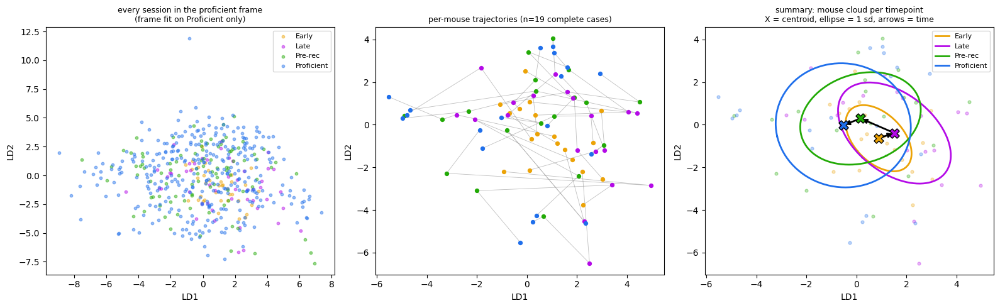

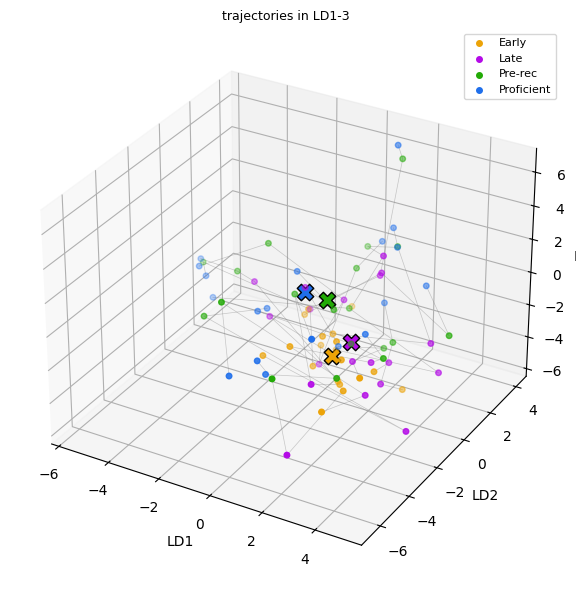

In [26]:
#%%
""" TRAJECTORIES IN THE PROFICIENT LDA SPACE """
LD_X, LD_Y = 'LD1', 'LD2'

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# --- (a) all sessions, coloured by timepoint ---
ax = axes[0]
dfa = pd.DataFrame(coords, columns=[f'LD{i+1}' for i in range(coords.shape[1])])
dfa['timepoint'] = timepoint
for lab in ORDER:
    s = dfa[dfa.timepoint == lab]
    ax.scatter(s[LD_X], s[LD_Y], s=10, alpha=0.45, color=COLORS[lab], label=lab)
ax.set_xlabel(LD_X); ax.set_ylabel(LD_Y); ax.legend(fontsize=8)
ax.set_title('every session in the proficient frame\n(frame fit on Proficient only)', fontsize=9)

# --- (b) per-mouse trajectories, complete cases ---
ax = axes[1]
for m in complete:
    pts = np.vstack([per_tp[l].loc[m, [LD_X, LD_Y]].values for l in ORDER])
    ax.plot(pts[:, 0], pts[:, 1], '-', color='grey', lw=0.6, alpha=0.5, zorder=1)
    for i, lab in enumerate(ORDER):
        ax.scatter(*pts[i], s=18, color=COLORS[lab], zorder=2)
ax.set_xlabel(LD_X); ax.set_ylabel(LD_Y)
ax.set_title(f'per-mouse trajectories (n={len(complete)} complete cases)', fontsize=9)

# --- (c) the SUMMARY: centroid trajectory + dispersion ellipse per timepoint ---
ax = axes[2]
for lab in ORDER:
    P = per_tp[lab].loc[[m for m in complete], [LD_X, LD_Y]].values
    c = P.mean(0)
    ax.scatter(P[:, 0], P[:, 1], s=12, color=COLORS[lab], alpha=0.30)
    # 1-sd ellipse from the covariance of the mouse cloud
    cov = np.cov(P.T)
    vals, vecs = np.linalg.eigh(cov)
    th = np.linspace(0, 2 * np.pi, 100)
    ell = (vecs @ (np.sqrt(np.maximum(vals, 0))[:, None] * np.array([np.cos(th), np.sin(th)]))).T + c
    ax.plot(ell[:, 0], ell[:, 1], color=COLORS[lab], lw=2, label=f'{lab}')
    ax.scatter(*c, marker='X', s=120, color=COLORS[lab], edgecolor='k', zorder=5)
cent = np.vstack([per_tp[l].loc[complete, [LD_X, LD_Y]].values.mean(0) for l in ORDER])
for i in range(len(ORDER) - 1):
    ax.annotate('', xy=cent[i + 1], xytext=cent[i],
                arrowprops=dict(arrowstyle='-|>', lw=2, color='k'))
ax.set_xlabel(LD_X); ax.set_ylabel(LD_Y); ax.legend(fontsize=8)
ax.set_title('summary: mouse cloud per timepoint\nX = centroid, ellipse = 1 sd, arrows = time', fontsize=9)

plt.tight_layout(); plt.show()

#%%
""" 3D VIEW (LD1-3) """
fig = plt.figure(figsize=(7, 6))
ax = fig.add_subplot(111, projection='3d')
for m in complete:
    pts = np.vstack([per_tp[l].loc[m, ['LD1', 'LD2', 'LD3']].values for l in ORDER])
    ax.plot(pts[:, 0], pts[:, 1], pts[:, 2], color='grey', lw=0.5, alpha=0.4)
for lab in ORDER:
    P = per_tp[lab].loc[complete, ['LD1', 'LD2', 'LD3']].values
    ax.scatter(P[:, 0], P[:, 1], P[:, 2], s=16, color=COLORS[lab], label=lab)
    c = P.mean(0)
    ax.scatter(*c, marker='X', s=140, color=COLORS[lab], edgecolor='k')
ax.set_xlabel('LD1'); ax.set_ylabel('LD2'); ax.set_zlabel('LD3')
ax.legend(fontsize=8); ax.set_title('trajectories in LD1-3', fontsize=9)
plt.tight_layout(); plt.show()


Using 19 matched mice, dims = ['LD1', 'LD2', 'LD3']

=== per-timepoint geometry ===
timepoint     dispersion  |centroid|
Early              2.234       3.281
Late               3.643       2.647
Pre-rec            3.752       0.798
Proficient         4.398       0.610

=== consecutive transformations (t -> t+1) ===
READ THE RESIDUAL FIRST. It is the fraction of the change that a scaled
rotation CANNOT explain (1.0 = no correspondence at all). If it is close to 1,
the angle is a rotation fitted to noise and means nothing.

transition                residual   scale            angles°   shift  refl
Early -> Late                0.911   0.674                 15   1.176     1
Late -> Pre-rec              0.885   0.480                 29   2.072     0
Pre-rec -> Proficient        0.601   0.937                  5   0.869     0

=== each timepoint vs Proficient (cumulative) ===
transition                 scale   angle°   shift  residual
Early -> Proficient        1.104     61.4   3.186     0.8

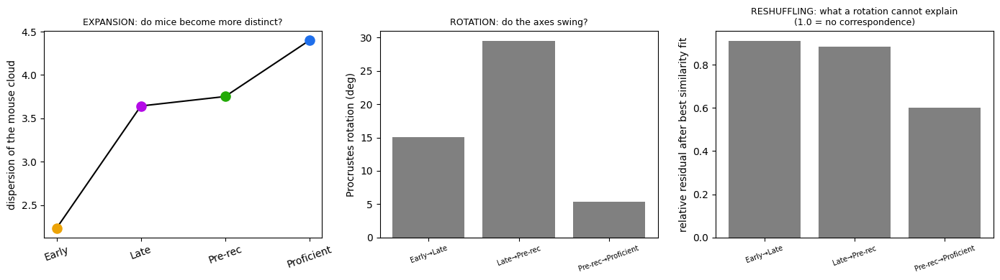

In [27]:
#%%
"""
WHAT TRANSFORMATION DOES TIME IMPOSE?
=====================================
Three things can change between timepoints and they mean different things:

  EXPANSION  the mice spread further apart along the same axes  -> dispersion grows
  TRANSLATION the whole cloud shifts                            -> centroid moves
  ROTATION   the axes along which mice differ change             -> Procrustes angle

They are separated by fitting the best similarity transform (scale s, orthogonal R,
shift t) between the matched mouse configurations at consecutive timepoints, and
reporting each component plus the RESIDUAL -- the part that is not a scaled rotation
at all. A large residual means the configuration was reshuffled, not transformed.

Everything here uses the complete-case mice, because Procrustes needs matched rows.
"""
USE_DIMS = ['LD1', 'LD2', 'LD3']

def config(lab, dims=USE_DIMS, mouse_list=None):
    ml = complete if mouse_list is None else mouse_list
    return per_tp[lab].loc[ml, dims].values

print(f"Using {len(complete)} matched mice, dims = {USE_DIMS}\n")
print("=== per-timepoint geometry ===")
print(f"{'timepoint':12s} {'dispersion':>11s} {'|centroid|':>11s}")
for lab in ORDER:
    P = config(lab)
    print(f"{lab:12s} {np.sqrt(((P - P.mean(0))**2).sum(1).mean()):11.3f} "
          f"{np.linalg.norm(P.mean(0)):11.3f}")

print("\n=== consecutive transformations (t -> t+1) ===")
print("READ THE RESIDUAL FIRST. It is the fraction of the change that a scaled")
print("rotation CANNOT explain (1.0 = no correspondence at all). If it is close to 1,")
print("the angle is a rotation fitted to noise and means nothing.\n")
print(f"{'transition':24s} {'residual':>9s} {'scale':>7s} {'angles°':>18s} {'shift':>7s} {'refl':>5s}")
trans = {}
for i in range(len(ORDER) - 1):
    a, b = ORDER[i], ORDER[i + 1]
    r = similarity_transform(config(a), config(b))
    trans[(a, b)] = r
    angs = ', '.join(f'{x:.0f}' for x in r['all_angles']) or '-'
    print(f"{a+' -> '+b:24s} {r['residual']:9.3f} {r['scale']:7.3f} {angs:>18s} "
          f"{r['shift']:7.3f} {r['n_reflections']:5d}")

print("\n=== each timepoint vs Proficient (cumulative) ===")
print(f"{'transition':24s} {'scale':>7s} {'angle°':>8s} {'shift':>7s} {'residual':>9s}")
for lab in ORDER[:-1]:
    r = similarity_transform(config(lab), config('Proficient'))
    print(f"{lab+' -> Proficient':24s} {r['scale']:7.3f} {r['angle_deg']:8.1f} "
          f"{r['shift']:7.3f} {r['residual']:9.3f}")

print("""
CAVEATS for the dispersion column above -- do not read it as 'individuality expands':
  1. Proficient sessions are IN-SAMPLE (the frame was fit on them); the other three
     are out-of-sample and get inflated coordinates by a shrinkage LDA. Use
     leave-one-mouse-out projection for Proficient to make them comparable.
  2. A mouse contributes ~1 session at Early/Late but several at Proficient, so its
     Proficient point is an average of more data and therefore less noisy. Cap the
     sessions per mouse per timepoint to equalise this.
Both push the comparison in the same direction, so the expansion trend is
confounded until they are handled.""")

#%%
"""
IS THE ROTATION MORE THAN CHANCE?
The residual and angle both have a null: if the mouse identities at one timepoint
carry no relation to the other, the best-fitting transform still returns SOME angle
and SOME residual. Permuting mouse identity gives that null.
"""
N_PERM = 500
rng_master = np.random.default_rng(0)

print(f"{'transition':24s} {'residual':>9s} {'null resid':>11s} {'p':>7s} | "
      f"{'angle°':>8s} {'null |angle|':>13s}")
for i in range(len(ORDER) - 1):
    a, b = ORDER[i], ORDER[i + 1]
    A, B = config(a), config(b)
    obs = similarity_transform(A, B)
    nres, nang = [], []
    for _ in range(N_PERM):
        p = rng_master.permutation(len(A))
        r = similarity_transform(A[p], B)
        nres.append(r['residual']); nang.append(abs(r['angle_deg']))
    nres = np.array(nres)
    # a REAL correspondence gives a SMALLER residual than shuffled identities
    pval = (np.sum(nres <= obs['residual']) + 1) / (N_PERM + 1)
    print(f"{a+' -> '+b:24s} {obs['residual']:9.3f} {nres.mean():11.3f} {pval:7.4f} | "
          f"{obs['angle_deg']:8.1f} {np.mean(nang):13.1f}")

#%%
""" SUMMARY FIGURE: how the geometry evolves """
fig, axes = plt.subplots(1, 3, figsize=(14, 4))
labs = ORDER
disp = [np.sqrt(((config(l) - config(l).mean(0))**2).sum(1).mean()) for l in labs]
axes[0].plot(range(len(labs)), disp, 'o-', color='k')
for i, l in enumerate(labs):
    axes[0].scatter(i, disp[i], s=90, color=COLORS[l], zorder=3)
axes[0].set_xticks(range(len(labs))); axes[0].set_xticklabels(labs, rotation=20)
axes[0].set_ylabel('dispersion of the mouse cloud')
axes[0].set_title('EXPANSION: do mice become more distinct?', fontsize=9)

pairs = [(ORDER[i], ORDER[i+1]) for i in range(len(ORDER)-1)]
axes[1].bar(range(len(pairs)), [trans[p]['angle_deg'] for p in pairs], color='grey')
axes[1].axhline(0, color='k', lw=0.8)
axes[1].set_xticks(range(len(pairs)))
axes[1].set_xticklabels([f'{a}→{b}' for a, b in pairs], rotation=20, fontsize=7)
axes[1].set_ylabel('Procrustes rotation (deg)')
axes[1].set_title('ROTATION: do the axes swing?', fontsize=9)

axes[2].bar(range(len(pairs)), [trans[p]['residual'] for p in pairs], color='grey')
axes[2].set_xticks(range(len(pairs)))
axes[2].set_xticklabels([f'{a}→{b}' for a, b in pairs], rotation=20, fontsize=7)
axes[2].set_ylabel('relative residual after best similarity fit')
axes[2].set_title('RESHUFFLING: what a rotation cannot explain\n(1.0 = no correspondence)', fontsize=9)
plt.tight_layout(); plt.show()


In [28]:
#%%
"""
PARAMETERISED, INTERACTIVE TRAJECTORY PLOTS
===========================================
Lines ALWAYS connect only points of the SAME mouse: each line is one trace built
from a single mouse's rows in `tps` order, hover-labelled "MOUSE: timepoint".
"""
import plotly.graph_objects as go
import plotly.io as pio

# RENDERER -- this is why the plots were not interactive. plotly's default here is
# 'browser', which opens an EXTERNAL window instead of rendering inline, so nothing
# interactive appears in the notebook. 'plotly_mimetype' is what the VSCode notebook
# renderer consumes; 'notebook_connected' is the classic-Jupyter fallback.
pio.renderers.default = 'vscode'   # VSCode-native; see fallbacks below
print("plotly renderer:", pio.renderers.default)
# ONE FIGURE PER CELL: VSCode renders only the LAST figure shown from a cell,
# so each plot below lives in its own cell. Do not merge them.
# If figures still do not appear:
#   VSCode .ipynb or Interactive Window -> pio.renderers.default = 'vscode'
#   classic Jupyter / offline           -> 'notebook'
#   always works                        -> save_html(fig) and open the file
# NOTE the matplotlib 3D plot earlier is STATIC; rotating it needs ipympl
# (not installed: `pip install ipympl`, then `%matplotlib widget`). The plotly
# figures below are the interactive ones.


# ---------------------------------------------------------------------------
# WEBGL: plotly's 3D traces (Scatter3d) are WebGL-only, and the VSCode notebook
# webview here reports "WebGL is not supported by your browser", so 3D figures
# cannot render inline. Three ways round it, in order of least effort:
#
#   1. show_or_save(fig) below writes a standalone .html -- open it in Firefox or
#      Chrome, where WebGL works, and you get the full rotatable plot.
#   2. Turn VSCode's GPU acceleration back on: Command Palette ->
#      "Preferences: Configure Runtime Arguments" -> set
#      "disable-hardware-acceleration": false  (and remove any --disable-gpu),
#      then restart VSCode.
#   3. For rotatable 3D INLINE without WebGL, use matplotlib's widget backend
#      instead: `pip install ipympl`, then put `%matplotlib widget` at the top and
#      use the matplotlib 3D cell. It is canvas-based, so no WebGL is needed.
#
# 2D plotly figures are unaffected -- go.Scatter renders as SVG, no WebGL. So
# dims=('LD1','LD2') works inline today.
# ---------------------------------------------------------------------------
WEBGL_AVAILABLE = False      # set True once VSCode/GPU can do WebGL


def save_html(fig, path='lda_trajectory.html'):
    """Renderer-independent escape hatch: standalone interactive HTML file."""
    fig.write_html(path, include_plotlyjs='cdn')
    print('wrote', os.path.abspath(path))
    return path


def show_or_save(fig, name='lda_trajectory'):
    """
    Show inline if the figure can render here, otherwise write an HTML file.
    3D needs WebGL; 2D (SVG) always renders inline.
    """
    is_3d = any(t.type in ('scatter3d', 'surface') for t in fig.data)
    if is_3d and not WEBGL_AVAILABLE:
        path = save_html(fig, f'{name}.html')
        print(f'   3D needs WebGL, which this webview lacks -> open {path} in a browser')
        return
    fig.show()


def select_mice(tps, complete_only=True):
    """Mice having ALL of `tps` (complete_only=True) or at least one of them."""
    sets = [set(per_tp[t].index) for t in tps]
    return sorted(set.intersection(*sets)) if complete_only else sorted(set.union(*sets))


def trajectory_table(tps, complete_only=True, dims=('LD1', 'LD2', 'LD3')):
    """Long form: one row per (mouse, timepoint) with its coordinates."""
    rows = []
    for m in select_mice(tps, complete_only):
        for t in tps:
            if m in per_tp[t].index:
                rows.append(dict(mouse=m, timepoint=t,
                                 **{d: per_tp[t].loc[m, d] for d in dims}))
    df = pd.DataFrame(rows)
    df['timepoint'] = pd.Categorical(df['timepoint'], categories=list(tps), ordered=True)
    return df.sort_values(['mouse', 'timepoint'])


def plot_trajectories_interactive(tps=None, complete_only=True, dims=('LD1', 'LD2', 'LD3'),
                                  show_centroids=True, per_mouse_legend=False,
                                  line_color='rgba(150,150,150,0.45)'):
    """
    tps              which timepoints, in temporal order (default: all of ORDER)
    complete_only    keep only mice present at EVERY selected timepoint
    dims             2 coords -> interactive 2D; 3 coords -> rotatable 3D
    per_mouse_legend give each mouse its own clickable legend entry
    """
    tps = list(ORDER if tps is None else tps)
    dims = list(dims)
    assert len(dims) in (2, 3), "dims must be 2 or 3 coordinates"
    df = trajectory_table(tps, complete_only, dims)
    n_mice = df.mouse.nunique()

    Trace = go.Scatter3d if len(dims) == 3 else go.Scatter
    def xyz(sub):
        d = dict(x=sub[dims[0]], y=sub[dims[1]])
        if len(dims) == 3:
            d['z'] = sub[dims[2]]
        return d

    fig = go.Figure()
    for m, sub in df.groupby('mouse', sort=False):
        if len(sub) < 2:
            continue
        fig.add_trace(Trace(**xyz(sub), mode='lines',
                            line=dict(color=line_color, width=2),
                            name=str(m), legendgroup=str(m),
                            showlegend=bool(per_mouse_legend),
                            hovertext=[f'{m}: {t}' for t in sub.timepoint],
                            hoverinfo='text'))
    for t in tps:
        sub = df[df.timepoint == t]
        fig.add_trace(Trace(**xyz(sub), mode='markers',
                            marker=dict(size=5 if len(dims) == 3 else 9,
                                        color=COLORS.get(t, '#888'),
                                        line=dict(width=0.5, color='black')),
                            name=t,
                            hovertext=[f'{m}: {t}' for m in sub.mouse],
                            hoverinfo='text'))
    if show_centroids:
        cent = df.groupby('timepoint', observed=True)[dims].mean().reindex(tps)
        fig.add_trace(Trace(**xyz(cent), mode='lines+markers',
                            line=dict(color='black', width=6),
                            marker=dict(size=11 if len(dims) == 3 else 16,
                                        color=[COLORS.get(t, '#888') for t in cent.index],
                                        symbol='diamond', line=dict(width=2, color='black')),
                            name='centroid', hovertext=list(cent.index), hoverinfo='text'))

    ttl = (f"trajectories in the proficient LDA frame — {n_mice} mice, "
           f"{'complete cases only' if complete_only else 'all available'}"
           f"<br><sub>{' → '.join(tps)}</sub>")
    if len(dims) == 3:
        fig.update_layout(scene=dict(xaxis_title=dims[0], yaxis_title=dims[1],
                                     zaxis_title=dims[2]))
    else:
        fig.update_layout(xaxis_title=dims[0], yaxis_title=dims[1])
    fig.update_layout(title=ttl, width=820, height=680, template='plotly_white',
                      legend=dict(itemsizing='constant'))
    return fig


fig_all = plot_trajectories_interactive(ORDER, complete_only=True)
show_or_save(fig_all, 'traj_3d_all_timepoints')



plotly renderer: vscode
wrote /home/ines/repositories/representation_learning_variability/paper-individuality/4_mice/traj_3d_all_timepoints.html
   3D needs WebGL, which this webview lacks -> open traj_3d_all_timepoints.html in a browser


In [29]:
#%%
""" VARIATIONS -- edit tps / complete_only / dims and re-run """
show_or_save(plot_trajectories_interactive(ORDER, complete_only=False), 'traj_3d_all_mice')



wrote /home/ines/repositories/representation_learning_variability/paper-individuality/4_mice/traj_3d_all_mice.html
   3D needs WebGL, which this webview lacks -> open traj_3d_all_mice.html in a browser


In [30]:
#%%
# training timepoints only (drops the IN-SAMPLE Proficient sessions, which are
# projected through a frame fit on themselves and so are not directly comparable)
show_or_save(plot_trajectories_interactive(['Early', 'Late', 'Pre-rec'], complete_only=True),
             'traj_3d_training_only')



wrote /home/ines/repositories/representation_learning_variability/paper-individuality/4_mice/traj_3d_training_only.html
   3D needs WebGL, which this webview lacks -> open traj_3d_training_only.html in a browser


In [31]:
#%%
# 2D is SVG, not WebGL -- this one renders inline even without GPU support
plot_trajectories_interactive(ORDER, complete_only=True, dims=('LD1', 'LD2')).show()



In [32]:
#%%
""" HOW MANY MICE DOES EACH SELECTION GIVE? """
from itertools import combinations
print(f"{'timepoints':40s} {'complete':>9s} {'any':>5s}")
for k in range(2, len(ORDER) + 1):
    for combo in combinations(ORDER, k):
        print(f"{' + '.join(combo):40s} {len(select_mice(combo, True)):9d} "
              f"{len(select_mice(combo, False)):5d}")


timepoints                                complete   any
Early + Late                                    35    51
Early + Pre-rec                                 19    55
Early + Proficient                              37   101
Late + Pre-rec                                  31    55
Late + Proficient                               49   101
Pre-rec + Proficient                            37   101
Early + Late + Pre-rec                          19    57
Early + Late + Proficient                       35   101
Early + Pre-rec + Proficient                    19   101
Late + Pre-rec + Proficient                     31   101
Early + Late + Pre-rec + Proficient             19   101


In [33]:
#%%
"""
ROTATABLE 3D -- the simple version
==================================
Same picture as the static matplotlib 3D plot, but you can turn it round.

No WebGL and no new packages: each frame is a normal matplotlib render, and
to_jshtml() wraps them in a little JS player with Play and a frame slider. Drag the
slider to rotate. (plotly's Scatter3d cannot be used here -- it is WebGL-only and
this webview reports WebGL as unavailable.)

If you would rather drag the plot directly with the mouse, that needs ipympl:
    pip install ipympl
then put `%matplotlib widget` at the top of the notebook and use plot_3d_static().
"""
from matplotlib import animation
from IPython.display import HTML


def _draw_3d(ax, tps, complete_only, dims, elev=20, azim=-60,
             show_centroids=True, line_alpha=0.35):
    """Draw the trajectories on a 3D axis. Lines connect only same-mouse points."""
    df = trajectory_table(tps, complete_only, dims)
    for m, sub in df.groupby('mouse', sort=False):
        if len(sub) > 1:
            ax.plot(sub[dims[0]], sub[dims[1]], sub[dims[2]],
                    color='grey', lw=0.7, alpha=line_alpha, zorder=1)
    for t in tps:
        s = df[df.timepoint == t]
        ax.scatter(s[dims[0]], s[dims[1]], s[dims[2]], s=22,
                   color=COLORS.get(t, '#888'), label=t, depthshade=False, zorder=2)
    if show_centroids:
        cent = df.groupby('timepoint', observed=True)[list(dims)].mean().reindex(tps)
        ax.plot(cent[dims[0]], cent[dims[1]], cent[dims[2]], color='k', lw=2.5, zorder=3)
        ax.scatter(cent[dims[0]], cent[dims[1]], cent[dims[2]], marker='X', s=150,
                   color=[COLORS.get(t, '#888') for t in cent.index],
                   edgecolor='k', linewidth=1.5, depthshade=False, zorder=4)
    ax.set_xlabel(dims[0]); ax.set_ylabel(dims[1]); ax.set_zlabel(dims[2])
    ax.view_init(elev=elev, azim=azim)
    return df


def plot_3d_rotating(tps=None, complete_only=True, dims=('LD1', 'LD2', 'LD3'),
                     n_frames=36, elev=20, figsize=(6.5, 6), dpi=80):
    """
    Rotating 3D trajectory plot with a Play button and a frame slider.
    n_frames=36 gives one frame per 10 degrees.
    """
    tps = list(ORDER if tps is None else tps)
    dims = list(dims)
    fig = plt.figure(figsize=figsize, dpi=dpi)
    ax = fig.add_subplot(111, projection='3d')
    df = _draw_3d(ax, tps, complete_only, dims, elev=elev)
    ax.legend(fontsize=8, loc='upper left')
    ax.set_title(f"{df.mouse.nunique()} mice, "
                 f"{'complete cases' if complete_only else 'all available'}\n"
                 f"{' → '.join(tps)}", fontsize=9)
    fig.tight_layout()

    def update(i):
        ax.view_init(elev=elev, azim=-60 + i * (360.0 / n_frames))
        return ax.collections

    anim = animation.FuncAnimation(fig, update, frames=n_frames, interval=120, blit=False)
    plt.close(fig)          # stop the static duplicate from also being shown
    return HTML(anim.to_jshtml())


def plot_3d_views(tps=None, complete_only=True, dims=('LD1', 'LD2', 'LD3'),
                  azims=(-60, 0, 30, 90), elev=20):
    """Instant alternative: the same cloud from several fixed angles, side by side."""
    tps = list(ORDER if tps is None else tps)
    dims = list(dims)
    fig = plt.figure(figsize=(4.2 * len(azims), 4.4))
    for k, az in enumerate(azims):
        ax = fig.add_subplot(1, len(azims), k + 1, projection='3d')
        _draw_3d(ax, tps, complete_only, dims, elev=elev, azim=az)
        ax.set_title(f'azim {az}°', fontsize=9)
        if k == 0:
            ax.legend(fontsize=7, loc='upper left')
    fig.tight_layout(); plt.show()


# ---- rotatable: drag the slider (or press Play) ----
plot_3d_rotating(ORDER, complete_only=False)


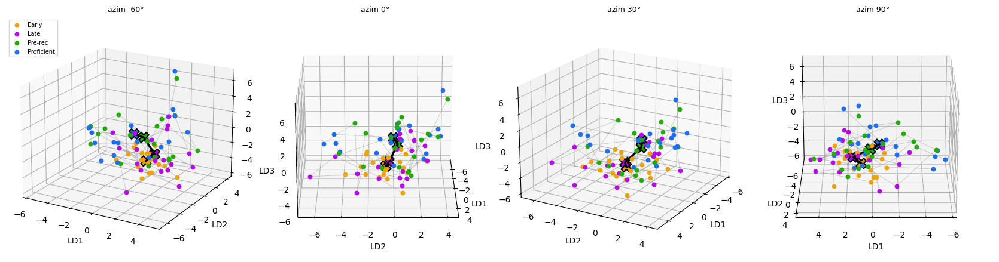

In [34]:
#%%
""" Fixed angles, instant -- useful for figures and for a quick look """
plot_3d_views(ORDER, complete_only=True)


In [35]:
#%%
""" Training timepoints only, rotatable (drops the in-sample Proficient sessions) """
plot_3d_rotating(['Early', 'Late', 'Pre-rec'], complete_only=True)


In [36]:
#%%
"""
IGNORE THE PROFICIENT DATA: FIT THE FRAME ON PRE-RECORDING
==========================================================
Pre-recording has 1-3 sessions per mouse, so it CAN support an LDA fit (unlike Early
or Late, which have one session per mouse and therefore no within-mouse scatter).
min_ref_sessions=2 keeps mice with at least two pre-recording sessions as classes.

Two things this buys you:
  * the proficient sessions play no part at all, so nothing depends on the LDA file
    or on the recording rig;
  * Early and Late stay fully out-of-sample, and the in-sample timepoint is now
    Pre-rec instead of Proficient -- so the earlier caveat moves rather than
    disappears. Pre-rec's dispersion is the one to distrust here.
"""
apply_frame('Pre-rec', min_ref_sessions=2, show=['Early', 'Late', 'Pre-rec'])



✓ frame = Pre-rec: fit on 93 sessions / 34 mice (>= 2 sessions each) -> 20 PCs -> 3 LDs
   3 Pre-rec sessions excluded from the FIT (mice with < 2 sessions there); still projected
   showing ['Early', 'Late', 'Pre-rec']; 19 mice present at all of them
     Early        37 mice
     Late         49 mice
     Pre-rec      37 mice  <- IN-SAMPLE (frame fit here)


(array([[ 3.46421177, -1.09934061,  7.15511661],
        [-0.34738223, -4.5113402 ,  4.36294988],
        [ 4.15640096, -1.7408615 ,  4.3316069 ],
        ...,
        [ 2.12965801,  0.68607448, -3.78539606],
        [-0.7093423 ,  5.50884243, -4.18960829],
        [ 2.04465801, -1.95885292, -0.02123539]], shape=(512, 3)),
 {'Early':                     LD1       LD2       LD3
  mouse                                      
  CSHL049       -1.254640 -2.143098  6.498714
  CSHL052        4.619131 -2.464461  4.632939
  CSHL053        1.029152 -4.243313  1.964275
  CSHL058        3.009200 -1.159549  4.742329
  CSHL059       -2.357465 -0.051894  5.955559
  CSH_ZAD_019    1.247313 -2.375381  3.391979
  CSH_ZAD_026    1.641703  0.026746  3.487712
  CSH_ZAD_029   -1.388353 -1.300567  4.462954
  DY_009         2.295677  0.586688  4.061257
  DY_010        -0.262540  0.681173  4.129748
  DY_011        -1.246433 -0.895681  4.625662
  DY_014         2.294405  0.653151  3.907823
  DY_016         3.364

In [37]:
#%%
plot_3d_rotating(ORDER, complete_only=True)



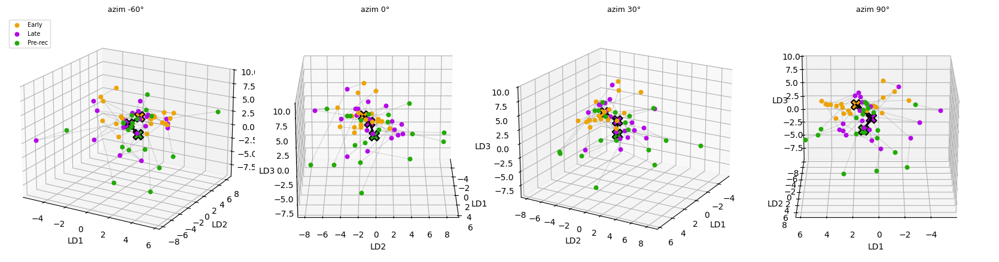

In [38]:
#%%
plot_3d_views(ORDER, complete_only=True)



In [39]:
#%%
""" the same geometry / transformation analysis, in the pre-recording frame """
print(f"{'timepoint':12s} {'dispersion':>11s} {'|centroid|':>11s}")
for lab in ORDER:
    P = config(lab)
    print(f"{lab:12s} {np.sqrt(((P - P.mean(0))**2).sum(1).mean()):11.3f} "
          f"{np.linalg.norm(P.mean(0)):11.3f}")

print(f"\n{'transition':24s} {'residual':>9s} {'scale':>7s} {'angles°':>18s} {'shift':>7s}")
for i in range(len(ORDER) - 1):
    a, b = ORDER[i], ORDER[i + 1]
    r = similarity_transform(config(a), config(b))
    angs = ', '.join(f'{x:.0f}' for x in r['all_angles']) or '-'
    print(f"{a+' -> '+b:24s} {r['residual']:9.3f} {r['scale']:7.3f} {angs:>18s} {r['shift']:7.3f}")



timepoint     dispersion  |centroid|
Early              2.948       5.006
Late               4.478       2.560
Pre-rec            5.958       1.323

transition                residual   scale            angles°   shift
Early -> Late                0.889   0.695                  1   2.494
Late -> Pre-rec              0.901   0.577                 51   2.067


In [40]:
#%%
""" back to the proficient frame when you want it """
# apply_frame('Proficient', 3, show=ALL_ORDER)


' back to the proficient frame when you want it '

reconstructed: 512 sessions x 40 trial bins x 10 features (paw 1 restored)


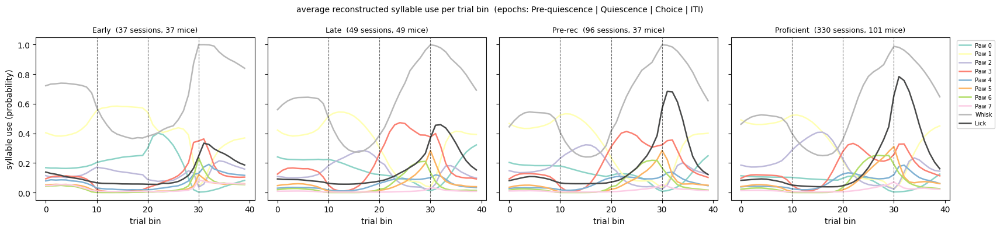

In [41]:
#%%
"""
AVERAGE BEHAVIOUR PER TIMEPOINT  (reconstructed syllable use per trial bin)
==========================================================================
Same reconstruction convention as LDA_analyses_pipeline_CORRECTED: the design
matrix is (trial_bins x features_per_bin) = (40 x 9) for the 10_bin files, where
the 9 are 7 paw states + whisk + lick. Paw state 1 was dropped by binarize() as the
redundant one-hot reference, so it is rebuilt as 1 - (sum of the other 7).
Epoch boundaries fall at bins 10 / 20 / 30 (Quiescence / Stimulus / Response).
"""
import seaborn as sns

N_PAW_STATES = 8

def reconstruct_syllables(Xmat, n_paw_states=N_PAW_STATES):
    """
    (n_sessions, n_features) -> (n_sessions, n_bins, n_paw_states + 2)
    with paw state 1 restored. Feature order out: paw0..paw7, whisk, lick.
    """
    npf = n_paw_states - 1 + 2                 # 9 features per bin as built
    assert Xmat.shape[1] % npf == 0, (
        f"{Xmat.shape[1]} features is not a multiple of {npf}; are keep_paw/"
        f"keep_whisk/keep_lick all True?")
    T = Xmat.shape[1] // npf
    R = Xmat.reshape(-1, T, npf)
    paw7 = R[:, :, :n_paw_states - 1]
    omitted = 1 - paw7.sum(axis=2)             # the dropped reference state
    full = np.zeros((Xmat.shape[0], T, n_paw_states + 2))
    full[:, :, 0] = paw7[:, :, 0]
    full[:, :, 1] = omitted
    full[:, :, 2:n_paw_states] = paw7[:, :, 1:]
    full[:, :, n_paw_states] = R[:, :, n_paw_states - 1]      # whisk
    full[:, :, n_paw_states + 1] = R[:, :, n_paw_states]      # lick
    return full


FEATURE_NAMES = [f'Paw {i}' for i in range(N_PAW_STATES)] + ['Whisk', 'Lick']
_pawpal = sns.color_palette('Set3', N_PAW_STATES)
FEATURE_COLORS = list(_pawpal) + ['#b8b8b8', '#484949']

recon = reconstruct_syllables(X)
N_BINS = recon.shape[1]
EPOCH_EDGES = [N_BINS // 4, N_BINS // 2, 3 * N_BINS // 4]
EPOCH_NAMES = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']
print(f"reconstructed: {recon.shape[0]} sessions x {N_BINS} trial bins x "
      f"{recon.shape[2]} features (paw 1 restored)")


def plot_average_behaviour(tps=None, per_mouse_first=True):
    """
    One panel per timepoint: mean syllable use across the 40 trial bins.
    per_mouse_first=True averages within a mouse before averaging across mice, so
    timepoints with many sessions per mouse are not dominated by those mice.
    """
    tps = all_order() if tps is None else list(tps)
    fig, axes = plt.subplots(1, len(tps), figsize=(4.3 * len(tps), 4), sharey=True)
    axes = np.atleast_1d(axes)
    for ax, t in zip(axes, tps):
        sel = timepoint == t
        if per_mouse_first:
            prof = np.vstack([recon[sel & (mice == m)].mean(0)[None]
                              for m in np.unique(mice[sel])]).mean(0)
        else:
            prof = recon[sel].mean(0)
        for j, (nm, col) in enumerate(zip(FEATURE_NAMES, FEATURE_COLORS)):
            ax.plot(np.arange(N_BINS), prof[:, j], color=col, lw=1.8, label=nm)
        for e in EPOCH_EDGES:
            ax.axvline(e, color='k', ls='--', lw=0.8, alpha=0.6)
        ax.set_title(f'{t}  ({sel.sum()} sessions, '
                     f'{len(np.unique(mice[sel]))} mice)', fontsize=9)
        ax.set_xlabel('trial bin')
    axes[0].set_ylabel('syllable use (probability)')
    axes[-1].legend(fontsize=7, bbox_to_anchor=(1.02, 1), loc='upper left')
    for ax, nm in zip(axes, EPOCH_NAMES):
        pass
    fig.suptitle('average reconstructed syllable use per trial bin  '
                 f'(epochs: {" | ".join(EPOCH_NAMES)})', fontsize=10)
    plt.tight_layout(); plt.show()


plot_average_behaviour()



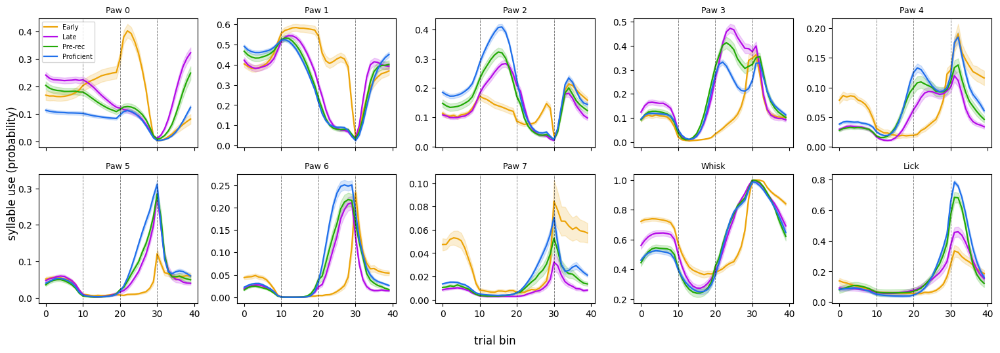

In [42]:
#%%
""" the same data the other way round: one panel per feature, timepoints overlaid,
    which is what actually makes the timepoint differences visible """
def plot_behaviour_by_feature(tps=None, features=None, per_mouse_first=True):
    tps = all_order() if tps is None else list(tps)
    features = FEATURE_NAMES if features is None else features
    idx = [FEATURE_NAMES.index(f) for f in features]
    ncol = 5
    nrow = int(np.ceil(len(idx) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=(3.1 * ncol, 2.7 * nrow),
                             sharex=True, squeeze=False)
    for k, j in enumerate(idx):
        ax = axes[k // ncol][k % ncol]
        for t in tps:
            sel = timepoint == t
            if per_mouse_first:
                prof = np.vstack([recon[sel & (mice == m)].mean(0)[None]
                                  for m in np.unique(mice[sel])])
            else:
                prof = recon[sel]
            mu = prof[:, :, j].mean(0)
            se = prof[:, :, j].std(0) / np.sqrt(len(prof))
            ax.plot(np.arange(N_BINS), mu, color=COLORS.get(t, '#888'), lw=1.6, label=t)
            ax.fill_between(np.arange(N_BINS), mu - se, mu + se,
                            color=COLORS.get(t, '#888'), alpha=0.18)
        for e in EPOCH_EDGES:
            ax.axvline(e, color='k', ls='--', lw=0.7, alpha=0.5)
        ax.set_title(FEATURE_NAMES[j], fontsize=9)
    for k in range(len(idx), nrow * ncol):
        axes[k // ncol][k % ncol].set_axis_off()
    axes[0][0].legend(fontsize=7)
    fig.supxlabel('trial bin'); fig.supylabel('syllable use (probability)')
    plt.tight_layout(); plt.show()


plot_behaviour_by_feature()


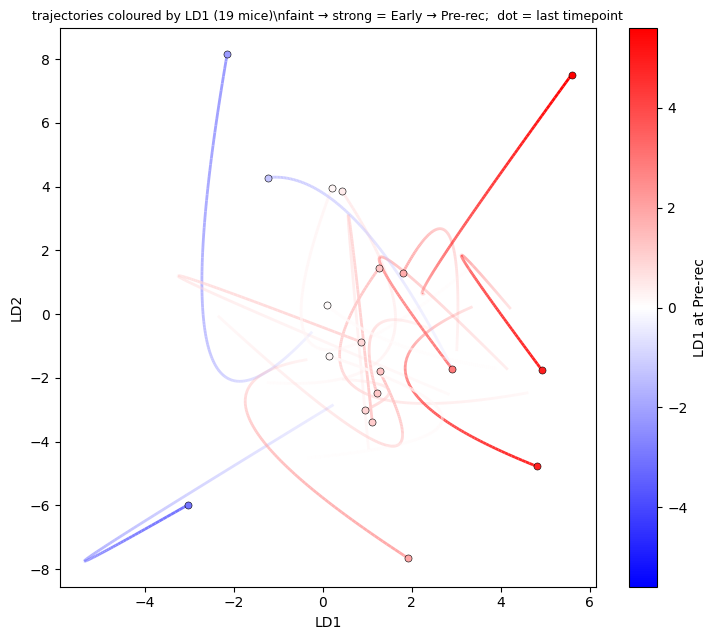

In [43]:
#%%
"""
TRAJECTORIES COLOURED BY LD1
============================
Each mouse's path is coloured by ITS OWN position on LD1 (blue = low, red = high),
the same blue-red convention as the other LD1 correlation figures. The path is
spline-smoothed through its timepoints, and the colour STRENGTHENS along the
trajectory (faint at the earliest timepoint, full saturation at the latest), so the
direction of time is readable without arrows.
"""
from matplotlib.collections import LineCollection
from matplotlib.colors import TwoSlopeNorm
from scipy.interpolate import make_interp_spline

LD1_CMAP = 'bwr'          # blue -> red

def ld1_scores(color_by=None):
    """A mouse's LD1 coordinate, taken at `color_by` (default: the frame's reference
    timepoint, i.e. its individuality coordinate in this embedding)."""
    color_by = frame['ref_label'] if color_by is None else color_by
    if color_by not in per_tp:
        color_by = ORDER[-1]
    return per_tp[color_by]['LD1'], color_by


def _smooth(P, n_interp=120):
    """Spline-smooth a path of >=2 points; falls back to linear for 2-3 points."""
    P = np.asarray(P, float)
    if len(P) < 3:
        t = np.linspace(0, 1, len(P))
        tt = np.linspace(0, 1, n_interp)
        return np.column_stack([np.interp(tt, t, P[:, d]) for d in range(P.shape[1])])
    t = np.linspace(0, 1, len(P))
    tt = np.linspace(0, 1, n_interp)
    k = min(3, len(P) - 1)
    return np.column_stack([make_interp_spline(t, P[:, d], k=k)(tt)
                            for d in range(P.shape[1])])


def plot_trajectories_ld1(tps=None, dims=('LD1', 'LD2'), color_by=None,
                          complete_only=True, n_interp=120, alpha_range=(0.12, 1.0),
                          lw=2.0, show_markers=True):
    tps = list(ORDER if tps is None else tps)
    dims = list(dims)
    assert len(dims) == 2, "this view is 2D"
    ld1, used = ld1_scores(color_by)
    df = trajectory_table(tps, complete_only, dims)
    mice_sel = [m for m in df.mouse.unique() if m in ld1.index]

    vmax = np.nanmax(np.abs(ld1.loc[mice_sel]))
    norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)
    cmap = plt.get_cmap(LD1_CMAP)

    fig, ax = plt.subplots(figsize=(7.5, 6.5))
    for m in mice_sel:
        sub = df[df.mouse == m]
        if len(sub) < 2:
            continue
        S = _smooth(sub[dims].values, n_interp)
        segs = np.stack([S[:-1], S[1:]], axis=1)
        base = np.array(cmap(norm(ld1.loc[m])))
        # colour strengthens along the path: alpha ramps up with time
        alphas = np.linspace(alpha_range[0], alpha_range[1], len(segs))
        cols = np.tile(base, (len(segs), 1)); cols[:, 3] = alphas
        ax.add_collection(LineCollection(segs, colors=cols, linewidths=lw, zorder=1))
        if show_markers:
            ax.scatter(sub[dims[0]].iloc[-1], sub[dims[1]].iloc[-1], s=26,
                       color=base[:3], edgecolor='k', linewidth=0.4, zorder=3)
    ax.autoscale_view()
    ax.set_xlabel(dims[0]); ax.set_ylabel(dims[1])
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm); sm.set_array([])
    plt.colorbar(sm, ax=ax, label=f'LD1 at {used}')
    ax.set_title(f'trajectories coloured by LD1 ({len(mice_sel)} mice)\\n'
                 f'faint → strong = {tps[0]} → {tps[-1]};  dot = last timepoint',
                 fontsize=9)
    plt.tight_layout(); plt.show()


plot_trajectories_ld1(ORDER, dims=('LD1', 'LD2'))



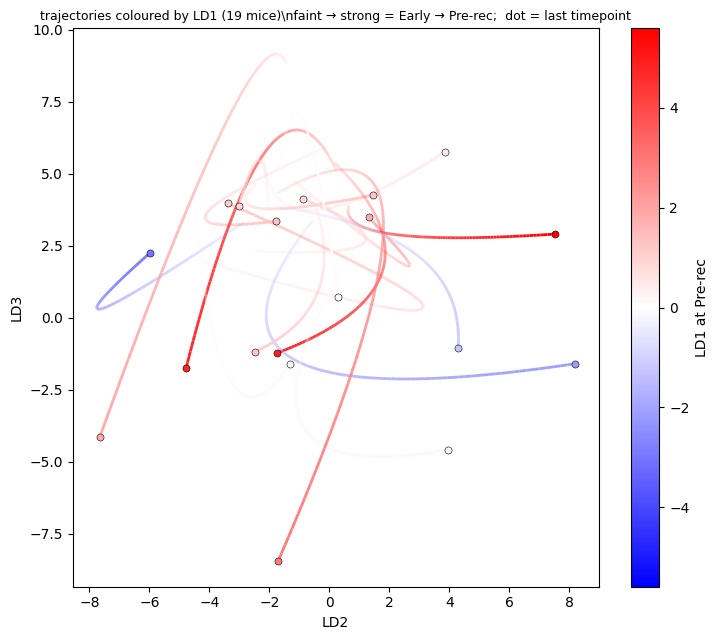

In [44]:
#%%
""" LD2 vs LD3, so the colour is not just the x-axis """
plot_trajectories_ld1(ORDER, dims=('LD2', 'LD3'))


 bin              LD1 range  mice
   1         (-3.04, -1.30]     2
   2          (-1.30, 0.42]     4
   3           (0.42, 2.14]     9
   4           (2.14, 3.87]     1
   5           (3.87, 5.59]     3


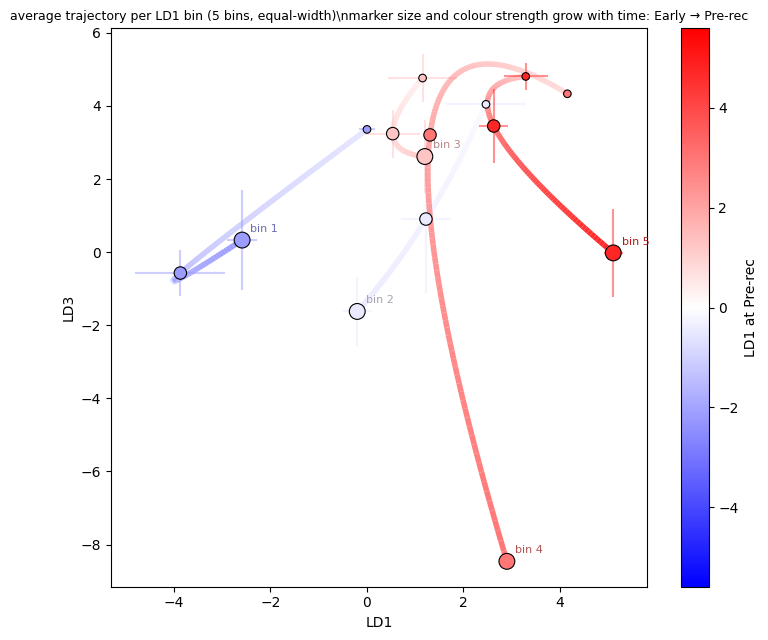

In [45]:
#%%
"""
AVERAGE TRAJECTORY PER LD1 BIN  (5 bins)
========================================
Mice are split into 5 bins along LD1 (pd.cut, equal-width, matching the binning in
LDA_analyses_pipeline_CORRECTED), and the trajectory is averaged within each bin.
Bin colour follows the same blue-red LD1 gradient, and colour strengthens along the
trajectory as before.

This is the across-mice summary: if learning moves low-LD1 and high-LD1 mice
differently, the 5 average paths will diverge rather than translate together.
"""
def plot_binned_average_trajectories(tps=None, dims=('LD1', 'LD3'), n_bins=5,
                                     color_by=None, binning='equal-width',
                                     complete_only=True, n_interp=120,
                                     alpha_range=(0.25, 1.0), show_sem=True):
    tps = list(ORDER if tps is None else tps)
    dims = list(dims)
    ld1, used = ld1_scores(color_by)
    df = trajectory_table(tps, complete_only, dims)
    mice_sel = [m for m in df.mouse.unique() if m in ld1.index]
    s = ld1.loc[mice_sel]

    if binning == 'quantile':
        lab = pd.qcut(s, n_bins, labels=False, duplicates='drop')
    else:
        lab = pd.cut(s, n_bins, labels=False)
    edges = (pd.qcut(s, n_bins, retbins=True, duplicates='drop')[1] if binning == 'quantile'
             else pd.cut(s, n_bins, retbins=True)[1])

    vmax = np.nanmax(np.abs(s)); norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)
    cmap = plt.get_cmap(LD1_CMAP)

    fig, ax = plt.subplots(figsize=(7.5, 6.5))
    print(f"{'bin':>4s} {'LD1 range':>22s} {'mice':>5s}")
    for b in range(n_bins):
        members = [m for m, l in zip(mice_sel, lab) if l == b]
        if len(members) == 0:
            print(f"{b+1:4d} {'(empty)':>22s} {0:5d}"); continue
        centre = float(np.mean([edges[b], edges[b + 1]]))
        print(f"{b+1:4d} {f'({edges[b]:.2f}, {edges[b+1]:.2f}]':>22s} {len(members):5d}")
        # mean path across the mice in this bin, timepoint by timepoint
        P = np.vstack([[df[(df.mouse == m) & (df.timepoint == t)][dims].values[0]
                        for t in tps] for m in members]).reshape(len(members), len(tps), 2)
        mu = P.mean(0)
        S = _smooth(mu, n_interp)
        segs = np.stack([S[:-1], S[1:]], axis=1)
        base = np.array(cmap(norm(centre)))
        cols = np.tile(base, (len(segs), 1))
        cols[:, 3] = np.linspace(alpha_range[0], alpha_range[1], len(segs))
        ax.add_collection(LineCollection(segs, colors=cols, linewidths=4.0, zorder=2))
        ax.scatter(mu[:, 0], mu[:, 1], s=np.linspace(30, 130, len(tps)),
                   color=base[:3], edgecolor='k', linewidth=0.8, zorder=3)
        if show_sem and len(members) > 1:
            se = P.std(0) / np.sqrt(len(members))
            ax.errorbar(mu[:, 0], mu[:, 1], xerr=se[:, 0], yerr=se[:, 1],
                        fmt='none', ecolor=base[:3], alpha=0.5, zorder=1)
        ax.annotate(f'bin {b+1}', mu[-1], textcoords='offset points',
                    xytext=(6, 6), fontsize=8, color=base[:3] * 0.7)
    ax.autoscale_view()
    ax.set_xlabel(dims[0]); ax.set_ylabel(dims[1])
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm); sm.set_array([])
    plt.colorbar(sm, ax=ax, label=f'LD1 at {used}')
    ax.set_title(f'average trajectory per LD1 bin ({n_bins} bins, {binning})\\n'
                 f'marker size and colour strength grow with time: '
                 f'{tps[0]} → {tps[-1]}', fontsize=9)
    plt.tight_layout(); plt.show()


plot_binned_average_trajectories(ORDER, n_bins=5)



 bin              LD1 range  mice
   1          (-3.03, 0.12]     4
   2           (0.12, 0.87]     4
   3           (0.87, 1.25]     3
   4           (1.25, 2.31]     4
   5           (2.31, 5.59]     4


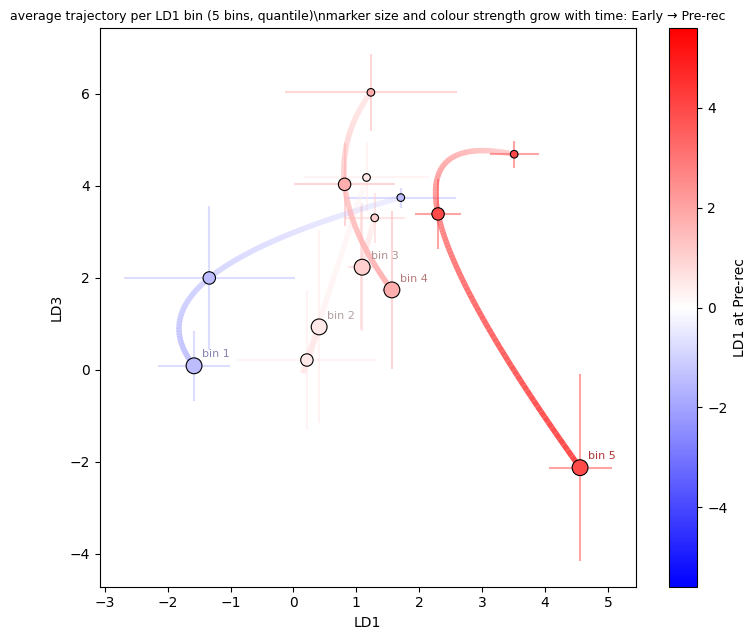

In [46]:
#%%
""" quantile bins instead, so each bin holds a similar number of mice """
plot_binned_average_trajectories(ORDER, n_bins=5, binning='quantile')
